# TFT Timeseries forecasting

# 1. EDA and Cleaning

We import featurewiz in order to create time-related features and pytorch_forecasting to define the Temporal fusion transformer (TFT) model and its hyperparameter tuning function.

In [1]:
!pip install --quiet featurewiz==0.0.42
!pip install --quiet pytorch_lightning
!pip install --quiet pytorch_forecasting
print('Installing TensorFlow Data Validation')
!pip install --upgrade 'tensorflow_data_validation[visualization]<2'

ERROR: After October 2020 you may experience errors when installing or updating packages. This is because pip will change the way that it resolves dependency conflicts.

We recommend you use --use-feature=2020-resolver to test your packages with the new resolver before it becomes the default.

imbalanced-learn 0.9.0 requires scikit-learn>=1.0.1, but you'll have scikit-learn 0.24.1 which is incompatible.
jupyter-console 6.4.3 requires jupyter-client>=7.0.0, but you'll have jupyter-client 6.1.7 which is incompatible.
You should consider upgrading via the 'c:\users\user\appdata\local\programs\python\python38\python.exe -m pip install --upgrade pip' command.
You should consider upgrading via the 'c:\users\user\appdata\local\programs\python\python38\python.exe -m pip install --upgrade pip' command.


Installing TensorFlow Data Validation


You should consider upgrading via the 'c:\users\user\appdata\local\programs\python\python38\python.exe -m pip install --upgrade pip' command.
El sistema no puede encontrar el archivo especificado.


In [11]:
!pip install pandas>=1.3.5
!pip install numpy --upgrade

You should consider upgrading via the 'c:\users\user\appdata\local\programs\python\python38\python.exe -m pip install --upgrade pip' command.


Requirement already up-to-date: numpy in c:\users\user\appdata\local\programs\python\python38\lib\site-packages (1.22.3)

You should consider upgrading via the 'c:\users\user\appdata\local\programs\python\python38\python.exe -m pip install --upgrade pip' command.


In [9]:
!pip install tensorflow>=2.8.0

You should consider upgrading via the 'c:\users\user\appdata\local\programs\python\python38\python.exe -m pip install --upgrade pip' command.


We import tensorflow data validation for the initial Exploratory data analysis of the train data

## 1.1 Imports

In [12]:
import os
import warnings
import pandas as pd
import featurewiz as FW
import numpy as np
import tensorflow as tf
import tensorboard as tb
import copy
from pathlib import Path
import warnings
import numpy as np
import torch
import pytorch_lightning as pl
from pytorch_lightning.callbacks import EarlyStopping, LearningRateMonitor, ModelCheckpoint
from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_forecasting import Baseline, TemporalFusionTransformer, TimeSeriesDataSet, DeepAR, NBeats
from pytorch_forecasting.data import GroupNormalizer, EncoderNormalizer
from pytorch_forecasting.metrics import SMAPE, PoissonLoss, QuantileLoss, MASE, MAPE, MAE, NormalDistributionLoss
from pytorch_forecasting.models.temporal_fusion_transformer.tuning import optimize_hyperparameters
import sys
import time
import gc
from tensorflow.keras import backend as K
from dateutil.relativedelta import relativedelta
from datetime import datetime
from sklearn.preprocessing import MinMaxScaler
import tensorflow_data_validation as tfdv
from TemporalFusionTransformerExample.preparation import preparation

RuntimeError: module compiled against API version 0xe but this version of numpy is 0xd

ImportError: SystemError: <built-in method __contains__ of dict object at 0x00000135611ACFC0> returned a result with an error set

## 1.2 Data download

We download the train, store and test data and define the datatype of the Date and StateHoliday column. 


In [19]:
train_data = pd.read_csv("TemporalFusionTransformerExample/data/train.csv")
store=pd.read_csv("TemporalFusionTransformerExample/data/store.csv")
test_data=pd.read_csv("TemporalFusionTransformerExample/data/test.csv")
train_data.Date=pd.to_datetime(train_data.Date)
train_data.StateHoliday=train_data.StateHoliday.astype(str)

## 1.3 Checking missing values and data types

We visualize the statistics and information for each column in the train and store dataframes using tensorflow data visualization. 

In [ ]:
train_stats =tfdv.generate_statistics_from_dataframe(train_data.merge(store, on="Store"))
tfdv.visualize_statistics(train_stats)

There are missing values in the columns CompetitionOpenSinceYear, CompetitionOpenSinceMonth and CompetitionDistance. We will drop the first two columns and fill the missing values in the CompetitionDistance column. We merge the Train and Store dataframes.

In [ ]:
train_data=train_data.merge(store[["Store", "CompetitionDistance", "StoreType", "Assortment"]], on="Store")

In [ ]:
train_data.isnull().sum()

Store                     0
DayOfWeek                 0
Date                      0
Sales                     0
Customers                 0
Open                      0
Promo                     0
StateHoliday              0
SchoolHoliday             0
CompetitionDistance    2642
StoreType                 0
Assortment                0
dtype: int64

There are three stores with missing values: 291, 622 and 879. 

In [ ]:
train_data[train_data.CompetitionDistance.isnull()].Store.unique()

array([291, 622, 879])

## 1.4 Filling missing values for Competition distance column

We fill the missing values with the median Competition distance (2330). 

In [ ]:
train_data.CompetitionDistance=train_data.CompetitionDistance.fillna(train_data.CompetitionDistance.median())

Then we checked if the values were filled for each store. 

In [ ]:
train_data[train_data.Store==291]

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,CompetitionDistance,StoreType,Assortment
263244,291,5,2015-07-31,10052,973,1,1,0,1,2330.0,d,a
263245,291,4,2015-07-30,9030,883,1,1,0,1,2330.0,d,a
263246,291,3,2015-07-29,8204,814,1,1,0,1,2330.0,d,a
263247,291,2,2015-07-28,10374,943,1,1,0,1,2330.0,d,a
263248,291,1,2015-07-27,11692,1086,1,1,0,1,2330.0,d,a
...,...,...,...,...,...,...,...,...,...,...,...,...
264181,291,6,2013-01-05,5316,552,1,0,0,0,2330.0,d,a
264182,291,5,2013-01-04,7687,920,1,0,0,0,2330.0,d,a
264183,291,4,2013-01-03,7285,871,1,0,0,0,2330.0,d,a
264184,291,3,2013-01-02,7658,876,1,0,0,1,2330.0,d,a


## 1.5 Filling missing sales 

It is necessary to check if a store has more than one Sales register for each unique date. 

In [ ]:
train_data.duplicated(["Date", "Store"]).sum()

0

Check if each date has a sales value for each store

In [ ]:
train_data.groupby("Store").size().reset_index()[0].value_counts()

942    934
758    180
941      1
Name: 0, dtype: int64

Calculate number of day between start and end date

In [ ]:
(train_data.Date.max()-train_data.Date.min()).days

941

We find that from 1115 stores, 934 have sales registered for all the 942 days considered in the train data, while 180 Stores have just 758 sales registered and 1 has 941 days. 

Find stores that didn't have a sale every day and why

In [ ]:
train_data.Store.value_counts().reset_index()[train_data.Store.value_counts().reset_index().Store==758]

,index,Store
935,539,758
936,46,758
937,89,758
938,1107,758
939,1012,758
...,...,...
1110,159,758
1111,637,758
1112,636,758
1113,633,758


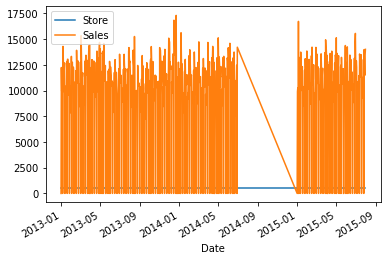

In [ ]:
train_data[["Date", "Store", "Sales"]][train_data.Store==539].set_index("Date").plot()

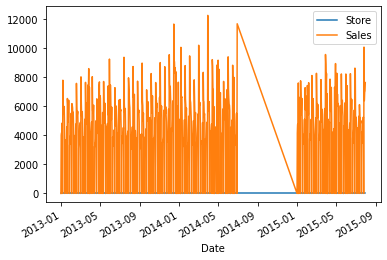

In [ ]:
train_data[["Date", "Store", "Sales"]][train_data.Store==46].set_index("Date").plot()

According to the plots, for some reason there were no sales for some stores between July, 2014 and january 2015. We check if this is the case fall all the stores with missing values. 

In [ ]:
train_data.Date.value_counts().reset_index().sort_values(by=["Date", "index"]).head(185)

,index,Date
825,2014-07-01,935
824,2014-07-02,935
823,2014-07-03,935
822,2014-07-04,935
821,2014-07-05,935
...,...,...
877,2014-12-28,935
876,2014-12-29,935
770,2014-12-30,935
758,2014-12-31,935


We reindex the dates and impute the empty data with the same values of the last year (July 2013-January 2014)

In [ ]:
train_data.Date.min()

Timestamp('2013-01-01 00:00:00')

In [ ]:
train_data.Date.max()

Timestamp('2015-07-31 00:00:00')

In [ ]:
date_index = pd.date_range(start="2013-01-01", end="2015-07-31", freq='D')

In [ ]:
def reindexing(df):
    df_reindexed=pd.DataFrame()
    for store in df["Store"].unique():
      #print(itemloc)
      df_aux=pd.DataFrame()
      df_aux=df[df["Store"]==store]
      df_aux=df_aux.set_index("Date").reindex(date_index).reset_index()
      df_aux[["Store", "CompetitionDistance", "StoreType", "Assortment"]]=df_aux[["Store", "CompetitionDistance", "StoreType", "Assortment"]].ffill().bfill()
      df_reindexed=df_reindexed.append(df_aux, ignore_index=True)
    return df_reindexed

In [ ]:
len(train_data)/train_data.Store.nunique()

942.0

We reindex the date column and fill the missing dates for the columns "CompetitionDistance", "StoreType" and "Assortment" with the last values of each store, since these are static variables.

In [ ]:
train_data=train_data.sort_values(by=["Store", "Date"])
train_data=reindexing(train_data)

Now we check wich columns have missing values

In [ ]:
train_data.isnull().sum()

index                      0
Store                      0
DayOfWeek              33121
Sales                  33121
Customers              33121
Open                   33121
Promo                  33121
StateHoliday           33121
SchoolHoliday          33121
CompetitionDistance        0
StoreType                  0
Assortment                 0
dtype: int64

In [ ]:
def add_last_year_values(df):
    df_reindexed=pd.DataFrame()
    for store in df["Store"].unique():
      #print(itemloc)
      df_aux=pd.DataFrame()
      df_aux=df[df["Store"]==store]
      df_aux[["previous_sales","previous_day","previous_customers", "previous_open", "previous_promo" ,"previous_state_holiday", "previous_school_holiday" ]]=df_aux.groupby([df_aux['Date'].dt.month,df_aux['Date'].dt.day])[['Sales', "DayOfWeek", "Customers", "Open", "Promo", "StateHoliday", "SchoolHoliday"]].shift().shift(-1)
      df_reindexed=df_reindexed.append(df_aux, ignore_index=True)
    return df_reindexed

To fill the missing values, we first create new columns with the last year sales using the shift function.

In [ ]:
train_data=train_data.rename(columns={"index":"Date"})
train_data=train_data.sort_values(by=["Store", "Date"])
train_data=train_data.reset_index(drop=True)
train_data=add_last_year_values(train_data)
train_data.Sales=train_data.Sales.fillna(-1)

In [ ]:
train_data.isnull().sum()

Date                            0
Store                           0
DayOfWeek                       1
Sales                           0
Customers                   33121
Open                        33121
Promo                       33121
StateHoliday                33121
SchoolHoliday               33121
CompetitionDistance             0
StoreType                       0
Assortment                      0
previous_sales             412556
previous_day               412556
previous_customers         412556
previous_open              412556
previous_promo             412556
previous_state_holiday     412556
previous_school_holiday    412556
dtype: int64

Then we fill the missing values with the values of this new past year columns. 

In [ ]:
train_data["DayOfWeek"]=train_data.apply(lambda row: row["previous_day"] if row["Sales"]==-1 else row["DayOfWeek"], axis=1)
train_data["Customers"]=train_data.apply(lambda row: row["previous_customers"] if row["Sales"]==-1 else row["Customers"], axis=1)
train_data["Open"]=train_data.apply(lambda row: row["previous_open"] if row["Sales"]==-1 else row["Open"], axis=1)
train_data["Promo"]=train_data.apply(lambda row: row["previous_promo"] if row["Sales"]==-1 else row["Promo"], axis=1)
train_data["StateHoliday"]=train_data.apply(lambda row: row["previous_state_holiday"] if row["Sales"]==-1 else row["StateHoliday"], axis=1)
train_data["SchoolHoliday"]=train_data.apply(lambda row: row["previous_school_holiday"] if row["Sales"]==-1 else row["SchoolHoliday"], axis=1)
train_data["Sales"]=train_data.apply(lambda row: row["previous_sales"] if row["Sales"]==-1 else row["Sales"], axis=1)

We plot the sales of one of the stores to check if the values were correctly filled. 

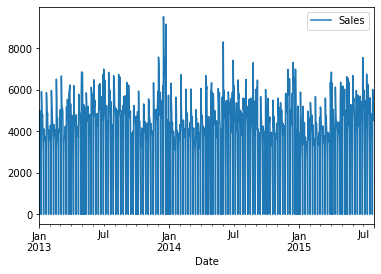

In [ ]:
train_data[["Date", "Store", "Sales"]][train_data.Store==988].set_index("Date")[["Sales"]].plot()

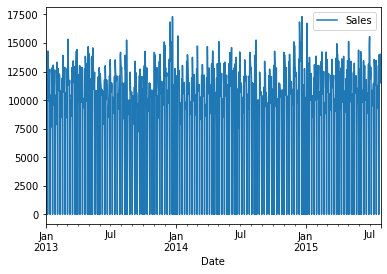

In [ ]:
train_data[["Date", "Store", "Sales"]][train_data.Store==539].set_index("Date")[["Sales"]].plot()

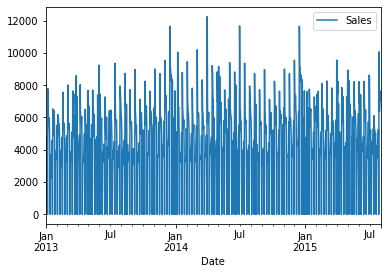

In [ ]:
train_data[["Date", "Store", "Sales"]][train_data.Store==46].set_index("Date")[["Sales"]].plot()

Then we take only the necessary columns for training and check if there are still missing values. 

In [ ]:
train_data=train_data[["Date", "Store","DayOfWeek", "Sales", "Customers", "Open", "Promo", "StateHoliday", "SchoolHoliday", "CompetitionDistance", "StoreType", "Assortment"]]

In [ ]:
train_data.isnull().sum()

Date                   0
Store                  0
DayOfWeek              1
Sales                  1
Customers              1
Open                   1
Promo                  1
StateHoliday           1
SchoolHoliday          1
CompetitionDistance    0
StoreType              0
Assortment             0
dtype: int64

There is one missing register, so we use the ffill function to fill this row. 

In [ ]:
train_data=train_data.ffill().bfill()

In [169]:
!rm -rf lightning_logs

In [287]:
train_data=pd.read_csv("train_data_prepared.csv").iloc[:, 1:]

# 2. Preprocessing

# 2.1 Scaling

In [288]:
def min_max_scaler(df, columns=["Customers","Sales"]):
        """
        Scales the data with a Min Max scaler.
        
        :param df: Input dataframe used to train the models predictions.
 
        :return scalers: Array with the scalers for each feature.
        :return data_train: Normalized input dataframe.

        """
        for column in columns:
          df_out=df[["Date", "Store", column]]
          df_out = df_out.sort_values(by='Date')
          df_out = df_out.reset_index()
          df_out = df_out.iloc[:, 1:]
          df_out = df_out.pivot(index='Date', columns='Store', values=column).reset_index()
          #df_out = df_out.fillna(value=value, method=method)
          df_out=df_out.set_index("Date")
          df_out =df_out.reindex(sorted(df_out.columns), axis=1)
          scalers={}
          for j in df_out.columns:
                  scaler = MinMaxScaler(feature_range=(-1,1))
                  s_s = scaler.fit_transform(df_out[j].values.reshape(-1,1))
                  s_s=np.reshape(s_s,len(s_s))
                  scalers['scaler_'+ str(j)] = scaler
                  df_out[j]=s_s
          df_out= df_out.stack()\
                  .reset_index(drop=False)\
                  .rename(columns={'level_1': 'Store', 0: column})\
                  .sort_values(by='Date',ascending=True)
          df=df.drop(columns=column).merge(df_out, on=["Date", "Store"])
        return scalers, df

In order to improve the training and validation accuracy, we scale the sales between -1 a 1 with a min max scaler.

In [289]:
scalers, train_data=min_max_scaler(train_data)

# 2.2 Add time index

In [290]:
train_data.Date=pd.to_datetime(train_data.Date)
test_data.Date=pd.to_datetime(test_data.Date)

We add a time_idx column necessary for training with temporal fusion transformer. 

In [291]:
time_idx=pd.DataFrame(sorted(train_data.Date.unique())).append(pd.DataFrame(sorted(test_data.Date.unique())))
time_idx=time_idx.reset_index(drop=True).reset_index().sort_values(by=0)
time_idx.columns=["time_idx", "Date"]
train_data=train_data.merge(time_idx, on=["Date"])

# 2.3 Define test data

Check if all the stores have the same prediction length

In [292]:
print(len(test_data)/test_data.Store.nunique())
print(test_data.Date.nunique())

48.0
48


We merge the store columns with the test data and fill the missing values of the Open column using a dictionary for weekdays and weekends.  

In [293]:
test_data.Date=pd.to_datetime(test_data.Date)
test_data=test_data.merge(time_idx, on="Date").sort_values(by=["Store", "Date"])
test_data=test_data.assign(Sales=0)
store_data=train_data[["Store",'CompetitionDistance', 'StoreType', 'Assortment']].drop_duplicates("Store", keep="first")
test_data=test_data.merge(store_data, on=["Store"]).drop(columns="Id")

In [294]:
open_dict={1:1,2:1,3:1,4:1,5:1,6:1,7:0}
test_data.Open=test_data.Open.fillna(test_data.DayOfWeek.map(open_dict))

To predict with the new dates and stores given in the test data, we merge the train and the test dataframes and save it in a new one called Data.

In [295]:
data=pd.concat([train_data,test_data], axis=0)
data=data.fillna(0)

# 2.4 Add date features

We use the Featurewiz library to add data features like 'Date_quarter', 'Date_is_summer',
       'Date_is_winter', 'Date_dayofmonth' and 'Date_weekofyear'

In [296]:
timestamp=data[["Date"]]
ts_column = 'Date'
data["Mes"]=pd.to_datetime(data[ts_column]).dt.month
data, ts_adds_in = FW.FE_create_time_series_features(data, ts_column, ts_adds_in=[])
data=data.drop(columns=[ 'Date_dayofweek',
       'Date_dayofweek_hour_cross', 'Date_month',
       'Date_is_festive','Date_is_cold',
       'Date_is_warm', 'Date_month_dayofweek_cross', 'Date_year',
       'Date_age_in_years', 'Date_dayofyear', 
        'Date_typeofday', 'Date_month_typeofday_cross'])
data["timestamp"]=timestamp

    created 19 columns from time series Date column
        dropped 2 time series added columns due to zero variance
        dropping Date column after time series done
    After dropping zero variance cols, shape of data: (1091418, 30)


# 3. Training

## 3.1 Set training parameters and timeseries dataset columns

We use a params_dict dictionary to set the training parameters and then we split the data into test and train datasets

In [297]:
params_dict={"forecast_horizon":48,
             "input_window":96,
             "batch_size":16,
             "group_ids":["Store"],
             "unknown_reals":["Sales", "Customers"],
             "known_reals":["time_idx", 'Date_quarter','Date_dayofmonth', 'Date_weekofyear'] ,
              "static_reals":["CompetitionDistance"],
             "static_categoricals":["StoreType", "Assortment"],
             "known_categoricals":[ 'Date_is_summer', 'Date_is_winter',"Mes",'DayOfWeek',"Open", "Promo", "StateHoliday", "SchoolHoliday"],
             "target":"Sales",
             "unknown_categoricals":[],
             }
n_stores=data.Store.nunique()

In [298]:
test_data=data[data.time_idx> (data.time_idx.max()-params_dict["forecast_horizon"]-params_dict["input_window"])]
data=data[data.time_idx<= (data.time_idx.max()-params_dict["forecast_horizon"])]

In [83]:
group_ids=["Store"] 
unknown_reals=["Sales", "Customers"]
known_reals=["time_idx", 'Date_quarter', 'Date_is_summer', 'Date_is_winter',
       'Date_dayofmonth', 'Date_weekofyear'] 
static_reals=["CompetitionDistance"]
static_categoricals=["StoreType", "Assortment"]
known_categoricals=["Mes",'DayOfWeek',"Open", "Promo", "StateHoliday", "SchoolHoliday"]
target="Sales"
unknown_categoricals=[]
n_stores=data.Store.nunique()

In [299]:
group_ids=["Store"] 
unknown_reals=["Sales", "Customers"]
known_reals=["time_idx", 'Date_quarter',"Mes",'DayOfWeek',
       'Date_dayofmonth', 'Date_weekofyear'] 
static_reals=["CompetitionDistance"]
static_categoricals=["StoreType", "Assortment"]
known_categoricals=[ 'Date_is_summer', 'Date_is_winter',"Open", "Promo", "StateHoliday", "SchoolHoliday"]
target="Sales"
unknown_categoricals=[]
n_stores=data.Store.nunique()

We create the TimeSeriesDataSet used for training models in the pytorch forecasting library with the parameters defined in the parameters dictionary. 

In [300]:
    def create_training_dataset(data,target, training_cutoff, group_ids, input_window,forecast_horizon, unknown_reals, known_reals, static_reals, unknown_categorical, known_categorical, static_categorical ):
        target_normalizer=EncoderNormalizer()
        training = TimeSeriesDataSet(
            data[data.time_idx <= training_cutoff],
            time_idx="time_idx",
            target=target,
            group_ids=group_ids,
            min_encoder_length=forecast_horizon ,  # keep encoder length long (as it is in the validation set)
            max_encoder_length=input_window,
            min_prediction_length=forecast_horizon,
            max_prediction_length=forecast_horizon,
            time_varying_unknown_reals=unknown_reals,
            time_varying_known_reals=known_reals,
            static_reals=static_reals,
            static_categoricals=static_categorical,
            time_varying_known_categoricals= known_categorical,
            time_varying_unknown_categoricals= unknown_categorical,
            target_normalizer=target_normalizer,
            add_relative_time_idx=True,
            add_target_scales=True,
            add_encoder_length=True,

        )
        return training

We modify the DataType of some numerical columns and convert them to string to use them as categorical features.

In [301]:
#data.Mes=data.Mes.astype(str)
#test_data.Mes=test_data.Mes.astype(str)
#data.DayOfWeek=data.DayOfWeek.astype(str)
#test_data.DayOfWeek=test_data.DayOfWeek.astype(str)
data.Open=data.Open.astype(str)
test_data.Open=test_data.Open.astype(str)
data.Promo=data.Promo.astype(str)
test_data.Promo=test_data.Promo.astype(str)
data.SchoolHoliday=data.SchoolHoliday.astype(str)
test_data.SchoolHoliday=test_data.SchoolHoliday.astype(str)
data.Date_is_summer=data.Date_is_summer.astype(str)
test_data.Date_is_summer=test_data.Date_is_summer.astype(str)
data.Date_is_winter=data.Date_is_winter.astype(str)
test_data.Date_is_winter=test_data.Date_is_winter.astype(str)

In [302]:
import io as io2
import matplotlib.pyplot as plt
def plot_to_image(figure):
  """Converts the matplotlib plot specified by 'figure' to a PNG image and
  returns it. The supplied figure is closed and inaccessible after this call."""
  # Save the plot to a PNG in memory.
  buf = io2.BytesIO()
  plt.savefig(buf, format='png')
  # Closing the figure prevents it from being displayed directly inside
  # the notebook.
  plt.close(figure)
  buf.seek(0)
  # Convert PNG buffer to TF image
  image = tf.image.decode_png(buf.getvalue(), channels=4)
  # Add the batch dimension
  image = tf.expand_dims(image, 0)
  return image

In [254]:
!rm -rf lightning_logs

In the main training function, we create the training and validation dataloaders in the pytorch forecasting format and make some baseline predictions. 

## 3.2 Create training and validation sets

In [303]:
    tf.io.gfile = tb.compat.tensorflow_stub.io.gfile
    predict={}
    file_writer = tf.summary.create_file_writer("lightning_logs/img")
    training_cutoff = data["time_idx"].max() -params_dict["forecast_horizon"]
    training=create_training_dataset(data, target, training_cutoff,group_ids, params_dict["input_window"], params_dict["forecast_horizon"], unknown_reals, known_reals,static_reals, unknown_categoricals, known_categoricals, static_categoricals)
    # create validation set (predict=True) which means to predict the last max_prediction_length points in time
    # for each series
    validation = TimeSeriesDataSet.from_dataset(training, data[data.time_idx <= (data["time_idx"].max())], predict=True, stop_randomization=True) 
    # create dataloaders for model
    train_dataloader = training.to_dataloader(train=True, batch_size=params_dict["batch_size"] , num_workers=0)
    val_dataloader = validation.to_dataloader(train=False, batch_size=2*params_dict["batch_size"], num_workers=0)
    print("Training cutoff: ", training_cutoff)
    #Baseline error
  

Training cutoff:  893
Baseline error:  0.3329482078552246
Baseline error median:  0.24794165790081024


## 3.3 Estimate baseline error

In [ ]:
    actuals = torch.cat([y for x, (y, weight) in iter(val_dataloader)])
    baseline_predictions = Baseline().predict(val_dataloader)
    print("Baseline error: ",(actuals - baseline_predictions).abs().mean().item())
    print("Baseline error median: ",(actuals - baseline_predictions).abs().median().item())

## 3.4 Hyperparameter tuning

We tune the temporal fusion transformer using 40 epochs and 8 trials. 

In [304]:

    # configure network and trainer
    # create study
    study = optimize_hyperparameters(
            train_dataloader,
            val_dataloader,
            model_path="lightning_logs",
            log_dir="lightning_logs",
            n_trials=15,
            max_epochs=50,
            gradient_clip_val_range=(0.01, 1),
            hidden_size_range=(16, 128),
            hidden_continuous_size_range=(8, 64),
            attention_head_size_range=(1, 4),
            learning_rate_range=(0.001, 0.1),
            dropout_range=(0.1, 0.4),
            trainer_kwargs=dict(limit_train_batches=100),
            reduce_on_plateau_patience=20,
            use_learning_rate_finder=False,  # use Optuna to find ideal learning rate or use in-built learning rate finder
            verbose=1
        )


[I 2022-03-07 01:22:21,714] A new study created in memory with name: no-name-cf0d695c-291d-4d89-a1b0-915b42653e1d
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
[I 2022-03-07 02:16:41,890] Trial 0 finished with value: 0.021550577133893967 and parameters: {'gradient_clip_val': 0.06179304907773203, 'hidden_size': 70, 'dropout': 0.3081405361889622, 'hidden_continuous_size': 13, 'attention_head_size': 1, 'learning_rate': 0.06896979746153718}. Best is trial 0 with value: 0.021550577133893967.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
[I 2022-03-07 02:18:00,132] Trial 1 pruned. Trial was pruned at epoch 1.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
[I 2022-03-07 02:20:05,747] Trial 2 pruned. Trial was pruned at epoch 1.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores


## 3.5 Plot training and validation loss

Then we take the best model tuned and predict the sales for the next 48 days and stores defined in the test_data, calculate the MSE error and save it in a dataframe called predict.

In [135]:
#best_model_path="epoch=45.ckpt"

## 3.6 Predict on validation data and estimate validation RMSE error

In [ ]:
    # show best hyperparameters
    print(study.best_trial.params)
    best_model_path="lightning_logs/trial_"+str(study.best_trial.number)+"/"+os.listdir("lightning_logs/trial_"+str(study.best_trial.number))[0]
    best_tft = TemporalFusionTransformer.load_from_checkpoint(best_model_path)
        
    # raw predictions are a dictionary from which all kind of information including quantiles can be extracted
    # calcualte mean absolute error on validation set
    raw_predictions,x = best_tft.predict(val_dataloader, mode="raw", return_x=True)
    #with file_writer.as_default():
    #  for idx, item in enumerate(data.Store.unique()):
    #    tf.summary.image("Prediction_"+str(item), plot_to_image(best_tft.plot_prediction(x, raw_predictions, idx=idx, add_loss_to_title=True)), step=0)
    aux=pd.DataFrame(raw_predictions["prediction"].numpy().reshape(n_stores*params_dict["forecast_horizon"] , 7))         
    print("Error mean: ",(actuals -aux[3].values.reshape(n_stores,params_dict["forecast_horizon"])).abs().mean() )
    print("Error median: ",(actuals -aux[3].values.reshape(n_stores,params_dict["forecast_horizon"])).abs().median() )
    #del a, aux, raw_predictions, trainer


## 3.7 Predict on test data

In [ ]:
predict=pd.DataFrame(best_tft.predict(test_data, mode="raw", return_x=False)["prediction"].numpy().reshape(n_stores*params_dict["forecast_horizon"] , 7)) 
#predict[0]=predict[0]/trng.backtests
predict.columns=["p5","p20","p40","p50","p60","p80","p95"]
predict.insert(7, "Store", np.repeat(data.Store.unique(), params_dict["forecast_horizon"]))
predict.insert(8, "time_idx", np.tile(np.arange(data.time_idx.max()+1,data.time_idx.max()+1+params_dict["forecast_horizon"]), n_stores))
#predict.to_csv("p"+str(0)+".csv")

In [48]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir lightning_logs

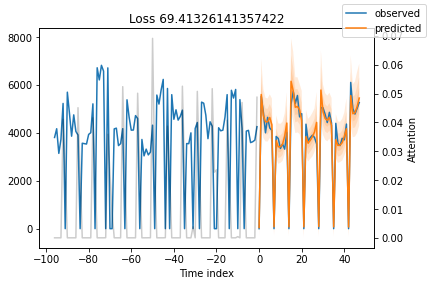

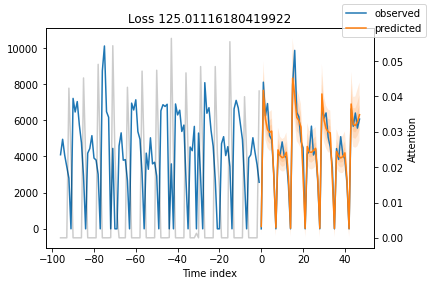

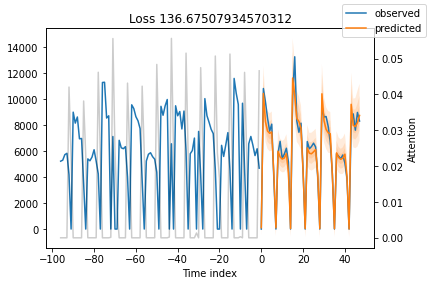

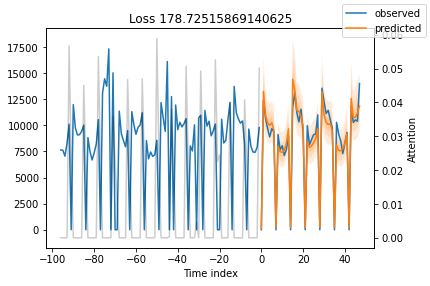

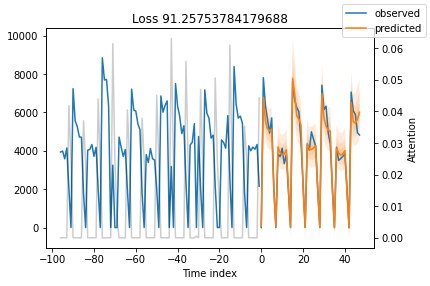

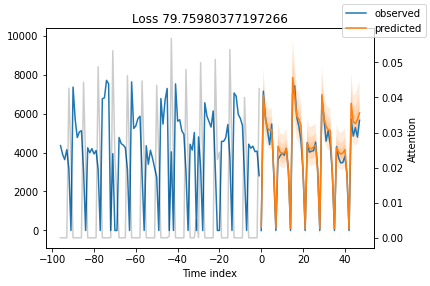

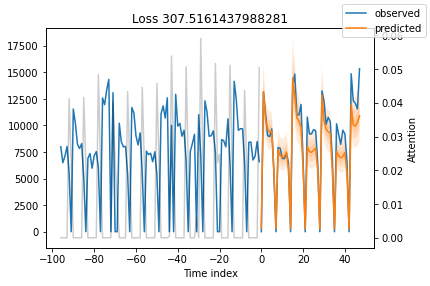

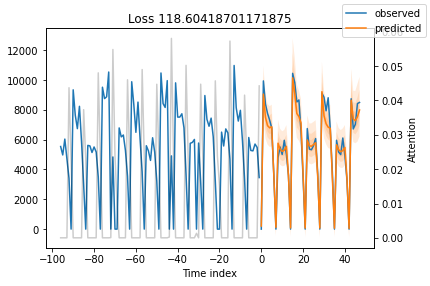

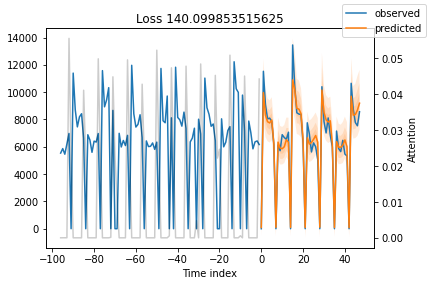

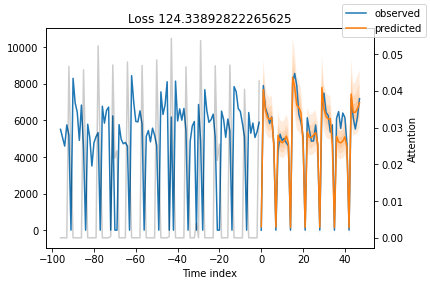

In [214]:
#Todos 35 epochs
for idx in range(0,10):  # plot 10 examples
    best_tft.plot_prediction(x, raw_predictions, idx=idx, add_loss_to_title=True);

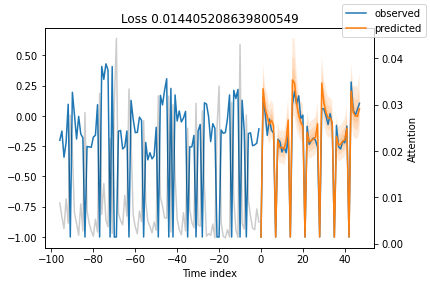

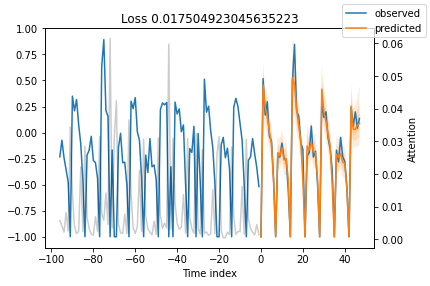

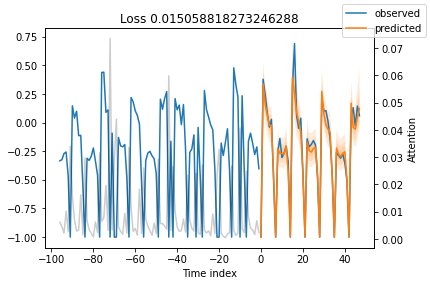

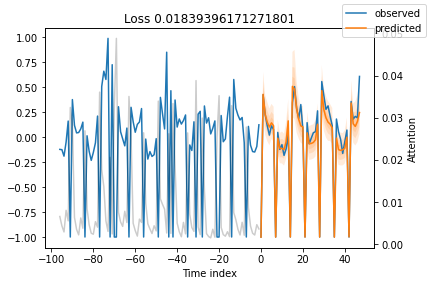

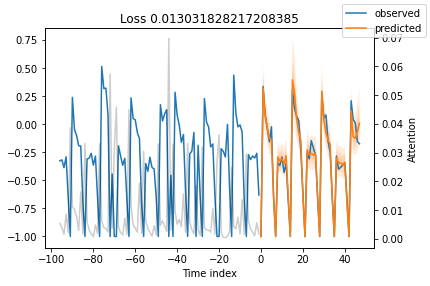

...

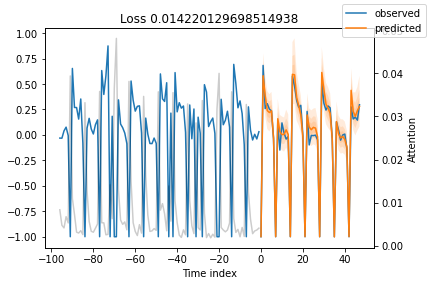

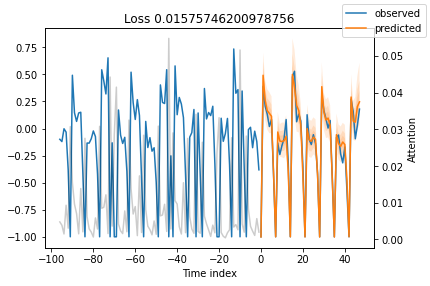

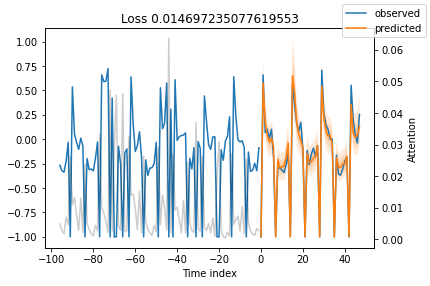

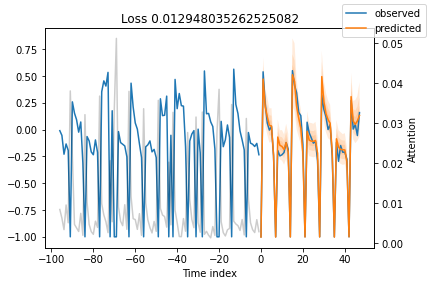

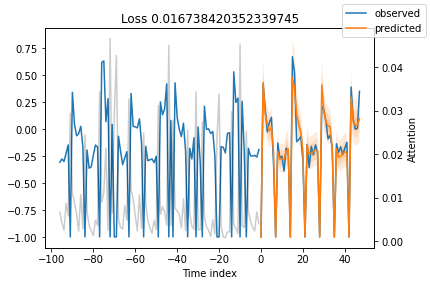

In [39]:
#Todos 35 epochs
for idx in range(0,120):  # plot 10 examples
    best_tft.plot_prediction(x, raw_predictions, idx=idx, add_loss_to_title=True);

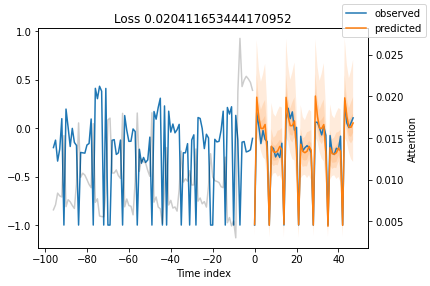

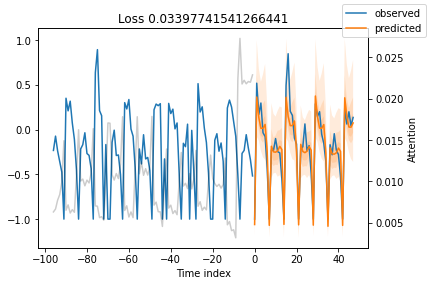

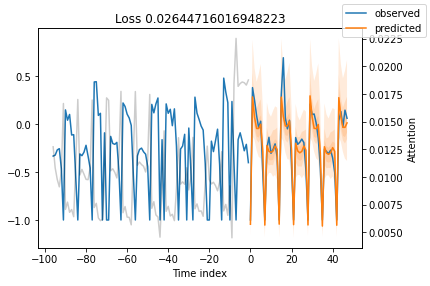

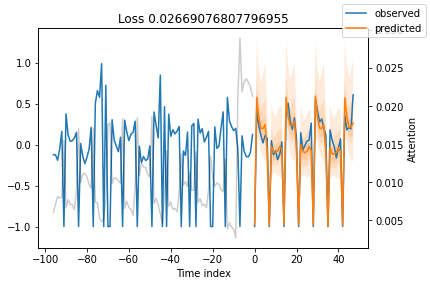

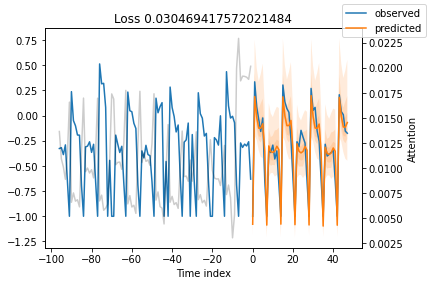

...

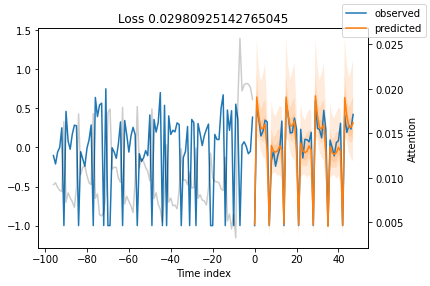

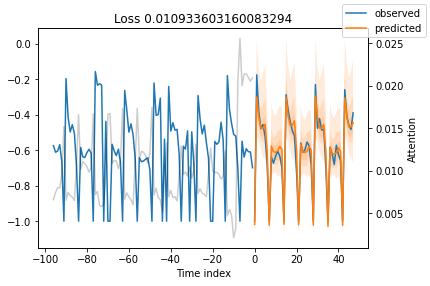

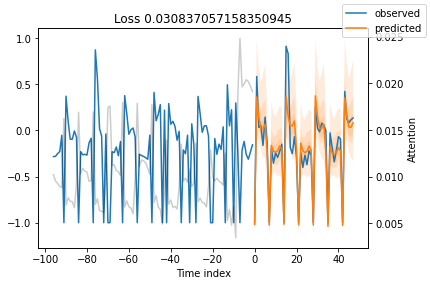

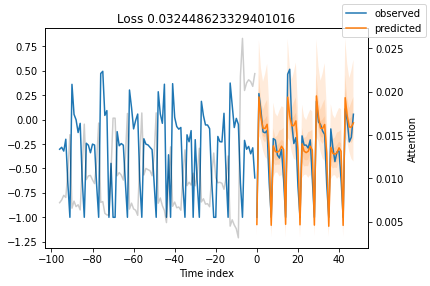

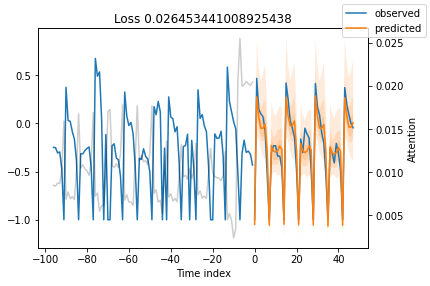

In [133]:
#Todos 35 epochs
for idx in range(0,60):  # plot 10 examples
    best_tft.plot_prediction(x, raw_predictions, idx=idx, add_loss_to_title=True);

In [261]:
def rescale(scalers, df):
        p1=pd.DataFrame()
        for key in scalers.keys():
            aux=pd.DataFrame()
            scaler=scalers[key]
            aux=pd.DataFrame(scaler.inverse_transform(df[df.Store==key.replace("scaler_", "")].iloc[:,:7]), columns=["p5",	"p20",	"p40",	"p50",	"p60",	"p80",	"p95"])
            p1=p1.append(aux, ignore_index=True)
        p1["Store"]=df["Store"]
        p1["time_idx"]=df["time_idx"]
        return p1

Rescale data

In [262]:
predict.Store=predict.Store.astype(str)
predict=rescale(scalers,predict)
#predict.to_csv("p"+str(1)+".csv")
stamps=test_data[["timestamp","time_idx"]].drop_duplicates("time_idx")
predict=predict.merge(stamps, on="time_idx")

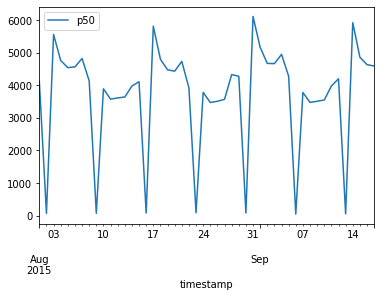

In [265]:
predict[predict.Store == "1.0"].set_index("timestamp")[["p50"]].plot()

In [266]:
predict.to_csv("p.csv")
predict=pd.read_csv("p.csv")
predict.timestamp=pd.to_datetime(predict.timestamp)
predict.Store=predict.Store.astype(int)
predict=predict.rename(columns={"p50":"Sales", "timestamp":"Date"})
predict.Sales=predict.apply(lambda row: row["Sales"] if row["Sales"]>=0 else 0,axis=1)

In [268]:
sample=pd.read_csv("sample_submission.csv")

In [269]:
test=pd.read_csv("test.csv")
test.Date=pd.to_datetime(test.Date)
test.Store=test.Store.astype(int)

In [270]:
train=pd.read_csv("train.csv")

In [271]:
submission=test.merge(predict[["Sales", "Store", "Date"]], on=["Date", "Store"])[["Id", "Store", "Sales"]]

In [272]:
submission.Sales=round(submission.Sales)
submission.Sales=submission.Sales.astype(int)
submission=submission.drop(columns=["Store"])

In [274]:
submission.to_csv("submission7.csv", index=False)